# Mask R-CNN - Train on Document Dataset


This notebook shows how to train Mask R-CNN on Document dataset. 

In [2]:
import os
import sys
#import piexif

import random
import math
import re
import time
import numpy as np
import cv2
import matplotlib
import matplotlib.pyplot as plt
import skimage
from PIL import Image, ImageDraw, ImageFont
# Root directory of the project
ROOT_DIR = os.path.abspath("../../")

# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library
from mrcnn.config import Config
from mrcnn import utils
import mrcnn.model as modellib
from mrcnn import visualize
from mrcnn.model import log
import pycocotools
%matplotlib inline 
import json
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval
from pycocotools import mask as maskUtils
# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

import pickle
# Local path to trained weights file
COCO_MODEL_PATH = os.path.join(ROOT_DIR, "mask_rcnn_coco.h5")
# Download COCO trained weights from Releases if needed
if not os.path.exists(COCO_MODEL_PATH):
    utils.download_trained_weights(COCO_MODEL_PATH)

Using TensorFlow backend.


## Configurations

In [3]:
class ShapesConfig(Config):
    """Configuration for training on the toy shapes dataset.
    Derives from the base Config class and overrides values specific
    to the toy shapes dataset.
    """
    # Give the configuration a recognizable name
    NAME = "shapes"

    # Train on 1 GPU and 1 images per GPU. We can put multiple images on each
    # GPU because the images are small. Batch size is 2 (GPUs * images/GPU).
    GPU_COUNT = 1
    
    # Number of classes (including background)
    NUM_CLASSES = 1 + 1  # background + 1 shapes


    # Use smaller anchors because our image and objects are small
    RPN_ANCHOR_SCALES = (32, 64, 128, 256, 512, 768)  # anchor side in pixels
    BACKBONE_STRIDES = [4, 8, 16, 32, 64,128]
    
config = ShapesConfig()
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64, 128]
BATCH_SIZE                     2
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 2
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                14
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE    

## Notebook Preferences

In [4]:

def get_ax(rows=1, cols=1, size=8):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Change the default size attribute to control the size
    of rendered images
    """
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax


## Dataset

Create a synthetic dataset

Extend the Dataset class and add a method to load the shapes dataset, `load_shapes()`, and override the following methods:

* load_image()
* load_mask()
* image_reference()

In [5]:
def seperate_x_and_y_points(poly):   
    poly = ''.join(poly);
    a = poly.split(',')            
    x_points = a[0::2]            
    y_points = a[1::2]
    #print(x_points, y_points)
    x_points = list(map(int, x_points))
    y_points = list(map(int, y_points))
    return x_points, y_points

class DocumentDataset(utils.Dataset):
    whichDataSetToLoad = ''
        
    def load_Document(self, dataset_dir, subset):
        """Load a subset of the Document dataset.
        dataset_dir: Root directory of the dataset.
        subset: Subset to load: train or val
        """
        # Add classes. We have only one class to add.
        self.add_class("Document", 1, "Document")

        # Train or validation dataset?
       # assert subset in ["train", "val"]
        dataset_dir = os.path.join(dataset_dir, subset)

    
        annotations = json.load(open(os.path.join(dataset_dir, "instances.json")))        
        
        for  i in range(len(annotations['images'])):
            polygon = list(dict())
            polygon = [{'name': 'polygon', 'all_points_x': [], 'all_points_y': []}]
            polygon[0]['name'] ='text'
            
            file_name = annotations['images'][i]['file_name']
            width = int(annotations['images'][i]['width'])
            height = int(annotations['images'][i]['height'])
        
            if(self.whichDataSetToLoad != 'ground_truth'):            
                image_path = os.path.join(dataset_dir, file_name)+ '.jpg'  
            if(self.whichDataSetToLoad == 'ground_truth'):   
                image_path = os.path.join(dataset_dir, file_name)+ '.png'  
            if(self.whichDataSetToLoad != 'h5py'):            
                image_path = os.path.join(dataset_dir, file_name)+ '.jpg'  
            
            segmentation = annotations['annotations'][i]['segmentation']
            polygons = []
            for poly in segmentation:   
                x_points, y_points = seperate_x_and_y_points(poly)                          
                polygon = {'name': 'polygon', 'all_points_x': [], 'all_points_y': []}
                polygon['name'] ='text'
                polygon['all_points_x'] = x_points
                polygon['all_points_y'] = y_points         
                polygons.append(polygon)
            self.add_image(
                    "Document",
                    image_id=file_name,  # use file name as a unique image id
                    path=image_path,
                    width=width, height=height,
                    polygons=polygons)
    def load_mask(self, image_id):
        """Generate instance masks for an image.
       Returns:
        masks: A bool array of shape [height, width, instance count] with
            one mask per instance.
        class_ids: a 1D array of class IDs of the instance masks.
        """
        # If not a Document dataset image, delegate to parent class.
        image_info = self.image_info[image_id]
        if image_info["source"] != "Document":
            return super(self.__class__, self).load_mask(image_id)

        # Convert polygons to a bitmap mask of shape
        # [height, width, instance_count]
        info = self.image_info[image_id]
        mask = np.zeros([info["height"], info["width"], len(info["polygons"])],
                        dtype=np.uint8)
        for i, p in enumerate(info["polygons"]):
            # Get indexes of pixels inside the polygon and set them to 1
            rr, cc = skimage.draw.polygon(p['all_points_y'], p['all_points_x'])
            mask[rr, cc, i] = 1

        # Return mask, and array of class IDs of each instance. Since we have
        # one class ID only, we return an array of 1s
        return mask.astype(np.bool), np.ones([mask.shape[-1]], dtype=np.int32)

    def image_reference(self, image_id):
        """Return the path of the image."""
        info = self.image_info[image_id]
        if info["source"] == "Document":
            return info["path"]
        else:
            super(self.__class__, self).image_reference(image_id)
        


In [6]:
path = os.path.join(os.getcwd(), '../../')
# Training dataset
dataset_train = DocumentDataset()
dataset_train.whichDataSetToLoad = 'training'
dataset_train.load_Document(os.path.join(path, 'datasets/documents/images/'), "train")
dataset_train.prepare()

dataset_train = DocumentDataset()
dataset_train.whichDataSetToLoad = 'h5py'
dataset_train.load_Document(os.path.join(path, 'datasets/documents/images/'), "train")
dataset_train.prepare()

# Validation dataset
dataset_val =  DocumentDataset()
dataset_train.whichDataSetToLoad = 'training'
dataset_val.load_Document(os.path.join(path, 'datasets/documents/images/'), "val")
dataset_val.prepare()


# Test dataset
dataset_test =  DocumentDataset()
dataset_train.whichDataSetToLoad = 'training'
dataset_test.load_Document(os.path.join(path, 'datasets/documents/images/'), "test")
dataset_test.prepare()



## Applying Augmentation

In [7]:
# Applying Augmentation

import numpy as np
import imgaug as ia
import imgaug.augmenters as iaa


seq = iaa.Sometimes(0.833, iaa.Sequential([
    iaa.Fliplr(0.5), # horizontal flips
    iaa.Crop(percent=(0, 0.3)), # random crops
    # Small gaussian blur with random sigma between 0 and 0.5.
    # But we only blur about 50% of all images.
    iaa.Sometimes(0.5,
        iaa.GaussianBlur(sigma=(0, 0.5))
    ),
    # Strengthen or weaken the contrast in each image.
    iaa.ContrastNormalization((0.75, 1.5)),
    # Add gaussian noise.
    # For 50% of all images, we sample the noise once per pixel.
    # For the other 50% of all images, we sample the noise per pixel AND
    # channel. This can change the color (not only brightness) of the
    # pixels.
    iaa.AdditiveGaussianNoise(loc=0, scale=(0.0, 0.05*255), per_channel=0.5),
    # Make some images brighter and some darker.
    # In 20% of all cases, we sample the multiplier once per channel,
    # which can end up changing the color of the images.
    iaa.Multiply((0.8, 1.2), per_channel=0.2),
    # Apply affine transformations to each image.
    # Scale/zoom them, translate/move them, rotate them and shear them.
    iaa.Affine(
        scale={"x": (0.8, 1.2), "y": (0.8, 1.2)},
        translate_percent={"x": (-0.2, 0.2), "y": (-0.2, 0.2)},
        rotate=(-25, 25),
        shear=(-8, 8)
    )
], random_order=True)) # apply augmenters in random order

/home/harsh/anaconda3/envs/cuda10/lib/python3.7/site-packages/imgaug/imgaug.py:182: DeprecationWarning: Function `ContrastNormalization()` is deprecated. Use `imgaug.contrast.LinearContrast` instead.
  warn_deprecated(msg, stacklevel=3)


## Create Model

In [10]:
# Create model in training mode
# model = modellib.MaskRCNN(mode="training", config=config,
#                           model_dir=MODEL_DIR)

# Create model in training mode
model_1 = modellib.MaskRCNN(mode="training", config=config,
                          model_dir=MODEL_DIR)

W1127 11:30:49.594231 140322499602176 deprecation_wrapper.py:119] From /home/harsh/anaconda3/envs/cuda10/lib/python3.7/site-packages/keras/backend/tensorflow_backend.py:541: The name tf.placeholder is deprecated. Please use tf.compat.v1.placeholder instead.

W1127 11:30:49.598989 140322499602176 deprecation_wrapper.py:119] From /home/harsh/anaconda3/envs/cuda10/lib/python3.7/site-packages/keras/backend/tensorflow_backend.py:66: The name tf.get_default_graph is deprecated. Please use tf.compat.v1.get_default_graph instead.

W1127 11:30:49.619125 140322499602176 deprecation_wrapper.py:119] From /home/harsh/anaconda3/envs/cuda10/lib/python3.7/site-packages/keras/backend/tensorflow_backend.py:4432: The name tf.random_uniform is deprecated. Please use tf.random.uniform instead.

W1127 11:30:49.635070 140322499602176 deprecation_wrapper.py:119] From /home/harsh/anaconda3/envs/cuda10/lib/python3.7/site-packages/keras/backend/tensorflow_backend.py:2139: The name tf.nn.fused_batch_norm is depre

In [ ]:
# Which weights to start with?
init_with = "last"  # imagenet, coco, or last

if init_with == "imagenet":
    model.load_weights(model.get_imagenet_weights(), by_name=True)
elif init_with == "coco":
    # Load weights trained on MS COCO, but skip layers that
    # are different due to the different number of classes
    # See README for instructions to download the COCO weights
    model.load_weights(COCO_MODEL_PATH, by_name=True,
                       exclude=["mrcnn_class_logits", "mrcnn_bbox_fc", 
                                "mrcnn_bbox", "mrcnn_mask"])
elif init_with == "last":
    # Load the last model you trained and continue training
    model.load_weights(model.find_last(), by_name=True)

## Training ( Uncomment when you want to run the training and save weights else use pretrained weights)

Train in two stages:
1. Only the heads. Here we're freezing all the backbone layers and training only the randomly initialized layers (i.e. the ones that we didn't use pre-trained weights from MS COCO). To train only the head layers, pass `layers='heads'` to the `train()` function.

2. Fine-tune all layers. For this simple example it's not necessary, but we're including it to show the process. Simply pass `layers="all` to train all layers.

In [11]:
# # Train the head branches
# # Passing layers="heads" freezes all layers except the head
# # layers. You can also pass a regular expression to select
# # which layers to train by name pattern.


# model.train(dataset_train, dataset_val, 
#             learning_rate=config.LEARNING_RATE, 
#             epochs=70, 
#             layers='heads', augmentation= seq)

In [18]:
# # Save weights head layer

# model_path = os.path.join(MODEL_DIR, "1.h5")
# model.keras_model.save_weights(model_path)


In [12]:

# # Training - Stage 2
# # Finetune layers from ResNet stage 4 and up
# print("Fine tune Resnet stage 3 and up")
# model.train(dataset_train, dataset_val,
#             learning_rate=config.LEARNING_RATE,
#             epochs=80,
#             layers='4+',
#             augmentation=seq)

In [20]:

# model_path = os.path.join(MODEL_DIR, "4_1.h5")
# model.keras_model.save_weights(model_path)


### Train if more than one GPU available

In [13]:

# # Training - Stage 3
# # Fine tune all layers
# print("Fine tune all layers")
# model.train(dataset_train, dataset_val,
#             learning_rate=config.LEARNING_RATE / 10,
#             epochs=90,
#             layers='all',
#             augmentation=seq)                  

In [ ]:

# model_path = os.path.join(MODEL_DIR, "random_crop_mode_stage_3_1.h5")
# model.keras_model.save_weights(model_path)


## Evaluation

In [8]:
class InferenceConfig(ShapesConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

inference_config = InferenceConfig()

# Recreate the model in inference mode
model = modellib.MaskRCNN(mode="inference", 
                          config=inference_config,
                          model_dir=MODEL_DIR)

# Get path to saved weights
# Either set a specific path or find last trained weights
# model_path = os.path.join(ROOT_DIR, ".h5 file name here")

#model_path = model.find_last()
model_path = os.path.join(MODEL_DIR, "4.h5")

# Load trained weights
print("Loading weights from ", model_path)
model.load_weights(model_path, by_name=True)

W0220 17:00:11.741683 140406338742016 deprecation_wrapper.py:119] From /home/harsh/anaconda3/envs/cuda10/lib/python3.7/site-packages/keras/backend/tensorflow_backend.py:541: The name tf.placeholder is deprecated. Please use tf.compat.v1.placeholder instead.

W0220 17:00:11.892285 140406338742016 deprecation_wrapper.py:119] From /home/harsh/anaconda3/envs/cuda10/lib/python3.7/site-packages/keras/backend/tensorflow_backend.py:66: The name tf.get_default_graph is deprecated. Please use tf.compat.v1.get_default_graph instead.

W0220 17:00:11.915001 140406338742016 deprecation_wrapper.py:119] From /home/harsh/anaconda3/envs/cuda10/lib/python3.7/site-packages/keras/backend/tensorflow_backend.py:4432: The name tf.random_uniform is deprecated. Please use tf.random.uniform instead.

W0220 17:00:12.020889 140406338742016 deprecation_wrapper.py:119] From /home/harsh/anaconda3/envs/cuda10/lib/python3.7/site-packages/keras/backend/tensorflow_backend.py:2139: The name tf.nn.fused_batch_norm is depre

Loading weights from  /home/harsh/Mask_RCNN/logs/4.h5


Ground Truth


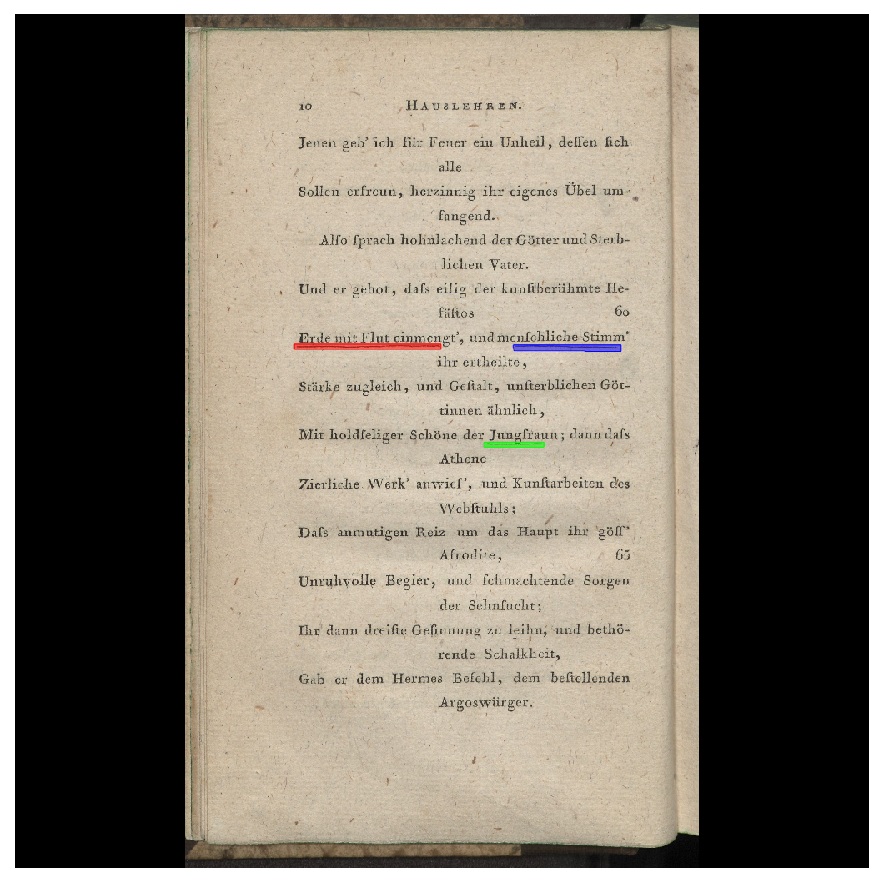

Prediction


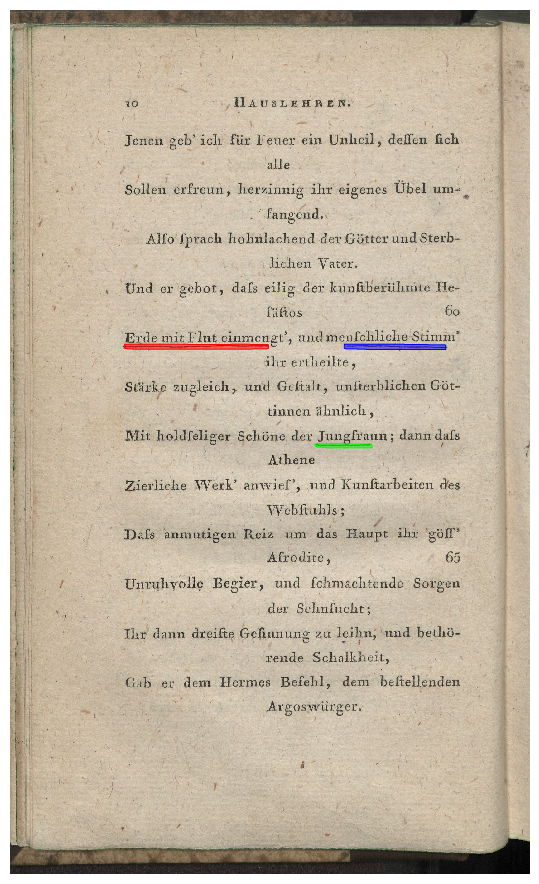

average: 0.95513


In [11]:
# New  method with Image size is kept original as test size image
from skimage import color
from skimage import io
from PIL import Image
import numpy as np
import scipy.misc
import subprocess


processes= []
image_ids =  dataset_test.image_ids
APs = []
IOU = 0
MSum = 0
mius = []

save_dir_prediction = None
save_dir_gt = None

if save_dir_prediction is None:
    save_dir_prediction = os.path.join(os.getcwd(), "output_test_prediction")
    if not os.path.exists(save_dir_prediction):
        os.makedirs(save_dir_prediction)

        
if save_dir_gt is None:
    save_dir_gt = os.path.join(os.getcwd(), "output_test_gt")
    if not os.path.exists(save_dir_gt):
        os.makedirs(save_dir_gt)


        
        
for image_id in image_ids:
    image_name = dataset_test.image_info[image_id]['id']+'.jpg'
    test_image = os.path.abspath("../../")
    test_image = os.path.join(test_image,'datasets', 'documents','images', 'test', image_name)
    
    
    test_image = np.asarray(Image.open(test_image))    
    results = model.detect([test_image], verbose=0)
    r = results[0]       
    
    original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
        modellib.load_image_gt(dataset_test, inference_config, 
                           image_id, use_mini_mask=False)
    print('Ground Truth')
    ground_truth = visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
                            dataset_test.class_names)
    
    ground_truth=Image.fromarray(ground_truth.astype('uint8'))    
    
    print('Prediction')    
    prediction = visualize.display_instances(test_image, r['rois'], r['masks'], r['class_ids'], 
                            dataset_test.class_names, r['scores']) 
    
    prediction=Image.fromarray(prediction.astype('uint8'))    
        
    
    height, width, channel = test_image.shape
    image = np.ones((height,width,3), dtype=int)
    
# Using ROI's, uncomment these and comment Using Masks, accuracy is 87.3751 %
#     for roi in r['rois']:       
#         y1, x1, y2, x2 = roi
#         image[y1:y2, x1:x2 ] = 2        
#     w, h, c = test_image.shape    
   
    
    
    # Using Masks, Accuracy is 92.13 %
    for i in range(r['masks'].shape[2]):
        mask = r['masks'][:, :, i]        
        for c in range(3):
            image[:, :, c] = np.where(mask == 1,2,image[:, :, c])                
    w, h, c = test_image.shape       
    
       
    prediction.save(os.path.join(save_dir_prediction, '%s' % (image_name)))
       
    ground_truth.save(os.path.join(save_dir_gt, '%s' % (image_name)))

    
    prediction_path = os.path.join(os.getcwd(), "prediction-private")
    
    splitArray =  image_name.split('.')
    image_name = splitArray[0]+ '.png'
    if not os.path.isdir(prediction_path):
        os.makedirs(prediction_path)
    prediction_filename = os.path.join(prediction_path, image_name)    
    image = Image.fromarray(image.astype('uint8'))
    image.save(prediction_filename)        
    gt_path = os.path.abspath("../../")
    gt_path = os.path.join(gt_path,'datasets', 'documents', 'ground_truth', 'test')
    splitArray = image_name.split('.')
    image_name =  splitArray[0]+ '.png'
    gt_path = os.path.join(gt_path, image_name)
    gt = Image.open(gt_path)      
    gt = np.array(gt).astype('uint8')
    gt = Image.fromarray(gt)
    
    image = np.array(image)

    jar_dir = os.path.abspath("../../")
    jar_file = os.path.join(jar_dir,'LayoutAnalysisEvaluator.jar')    
    processes.append(subprocess.Popen(["java", "-jar", jar_file, "-p", prediction_filename, "-gt", gt_path], stdout=subprocess.PIPE))
        
for p in processes:    
    miu = p.communicate()
    miu = float(miu[0].splitlines()[0].split()[-1])    
    mius.append(miu)    


print("average:", np.mean(mius))     

## Prediction on Cropped Image. Stiching the Image to get full Size prediction

Re-starting from epoch 80
Loading weights from  /home/harsh/Mask_RCNN/logs/random_crop_mode_stage_2_1.h5

*** No instances to display *** 



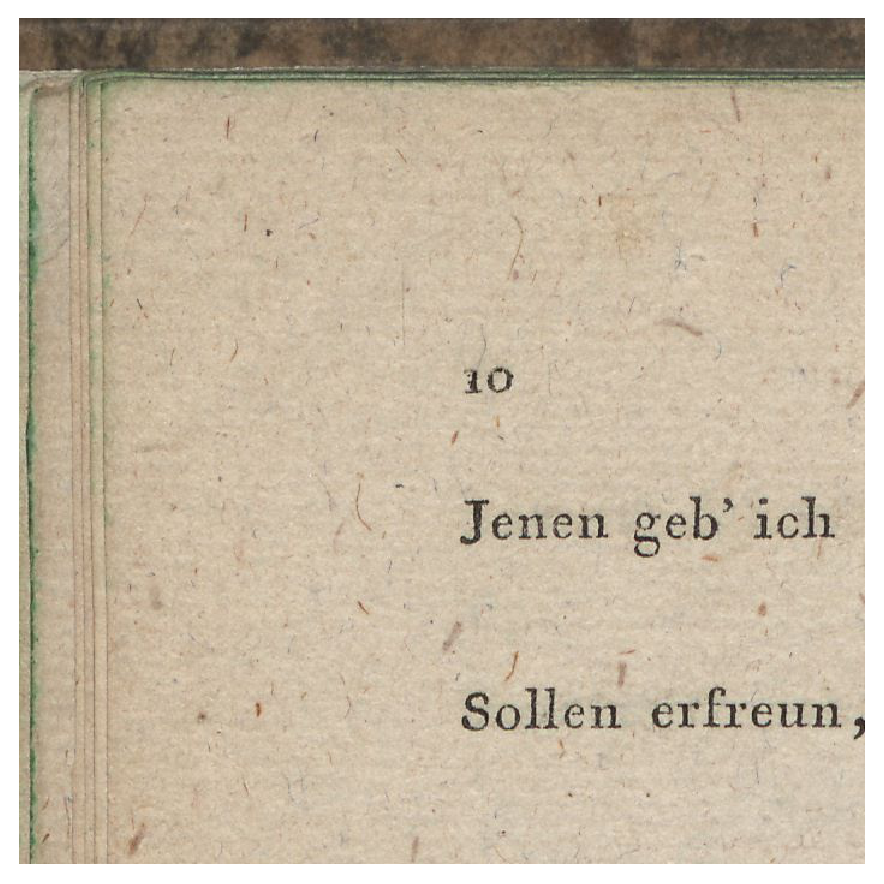


*** No instances to display *** 



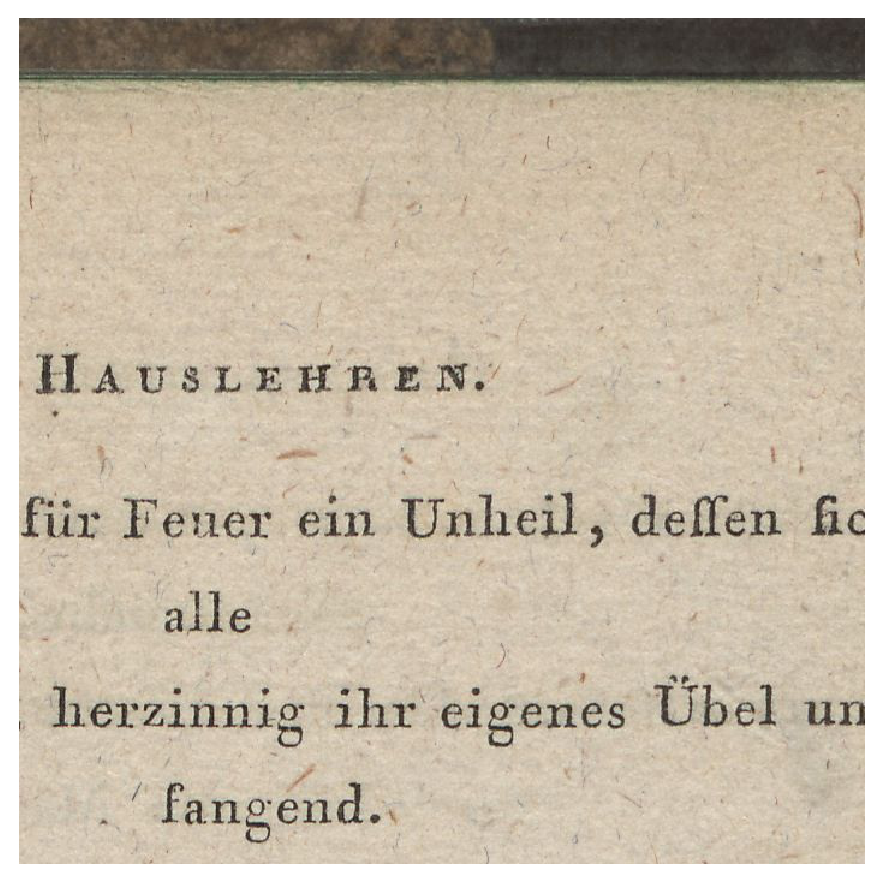


*** No instances to display *** 



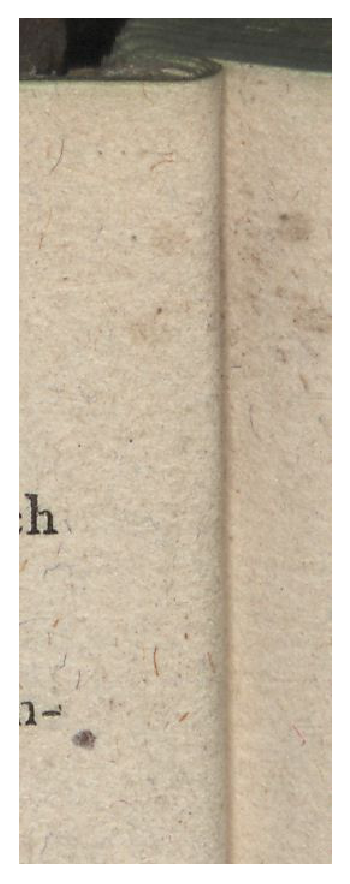

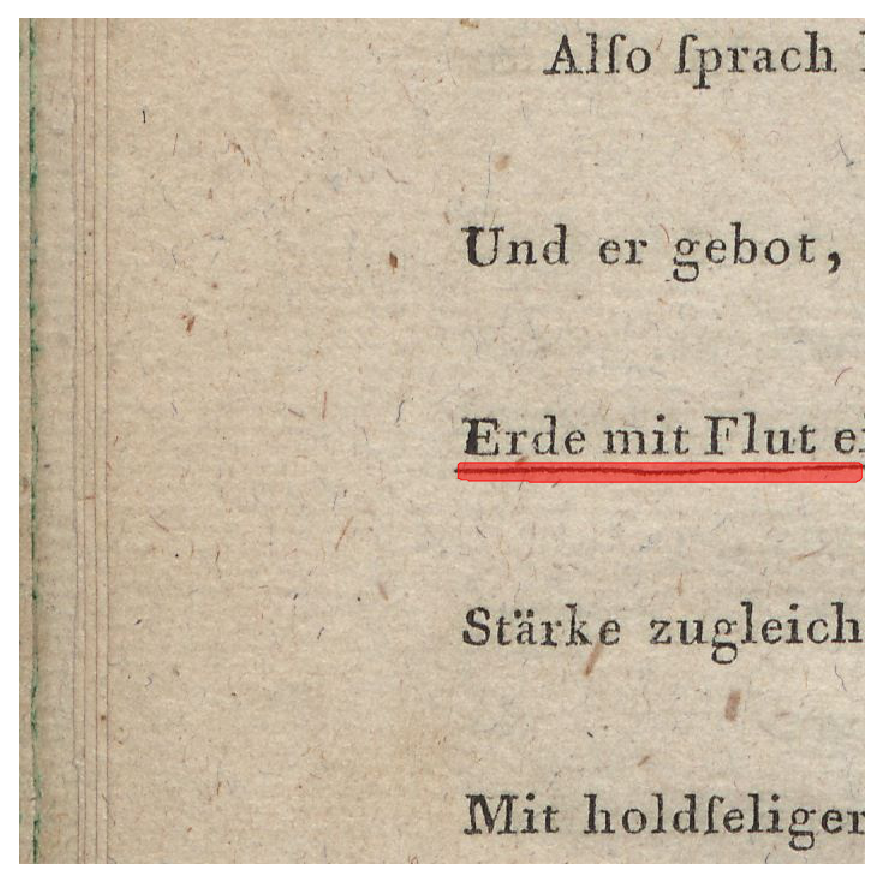

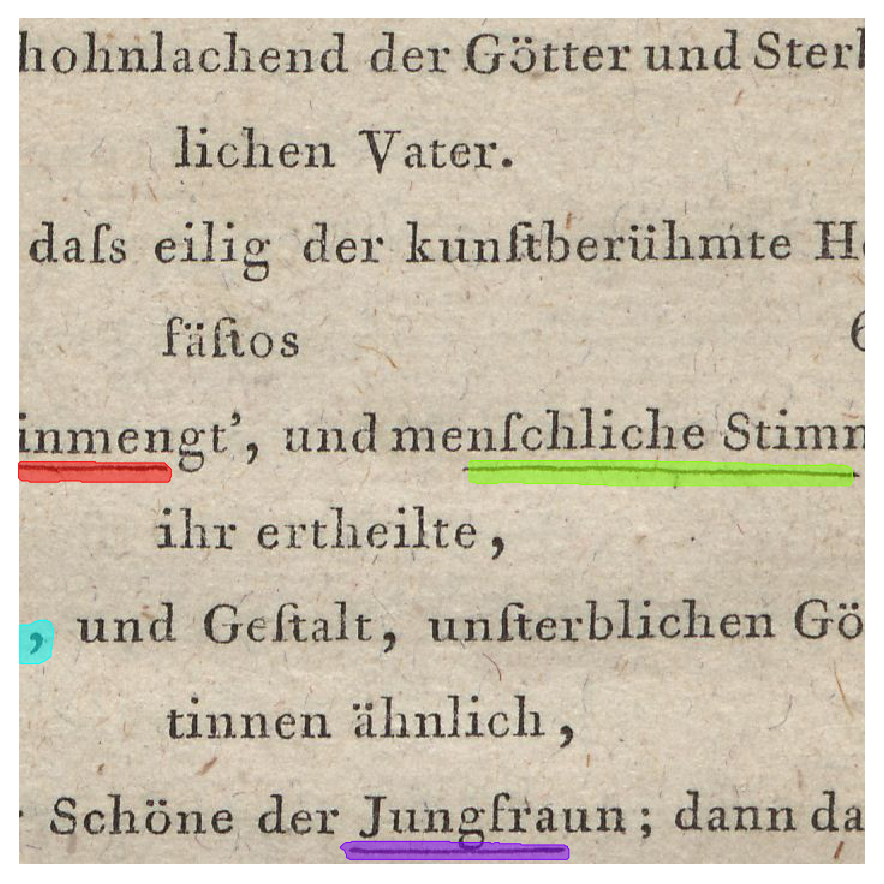


*** No instances to display *** 



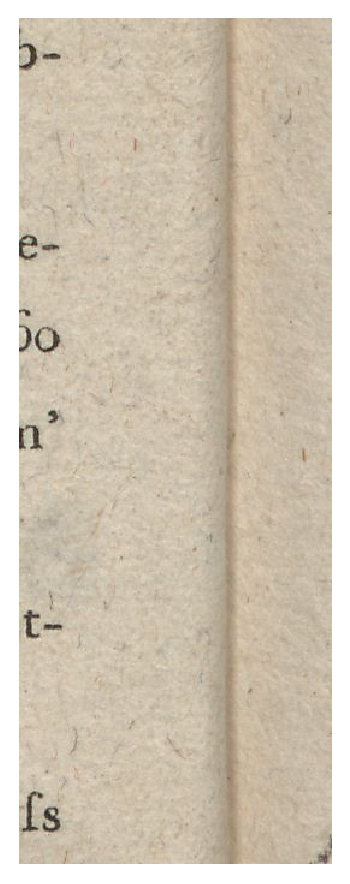

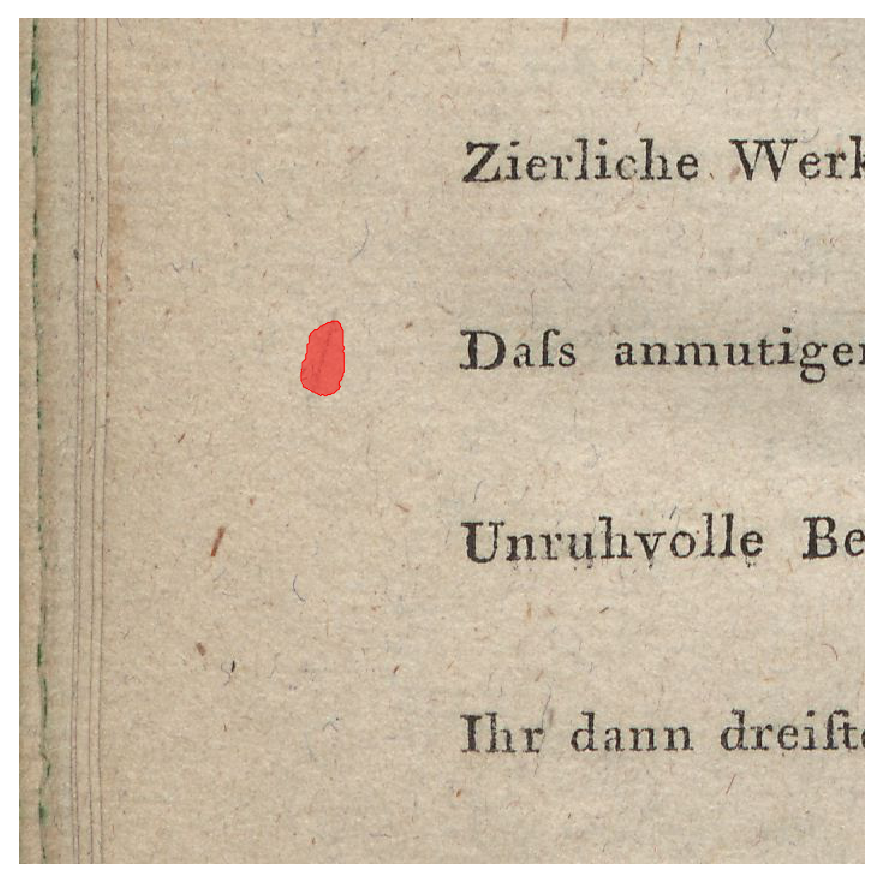

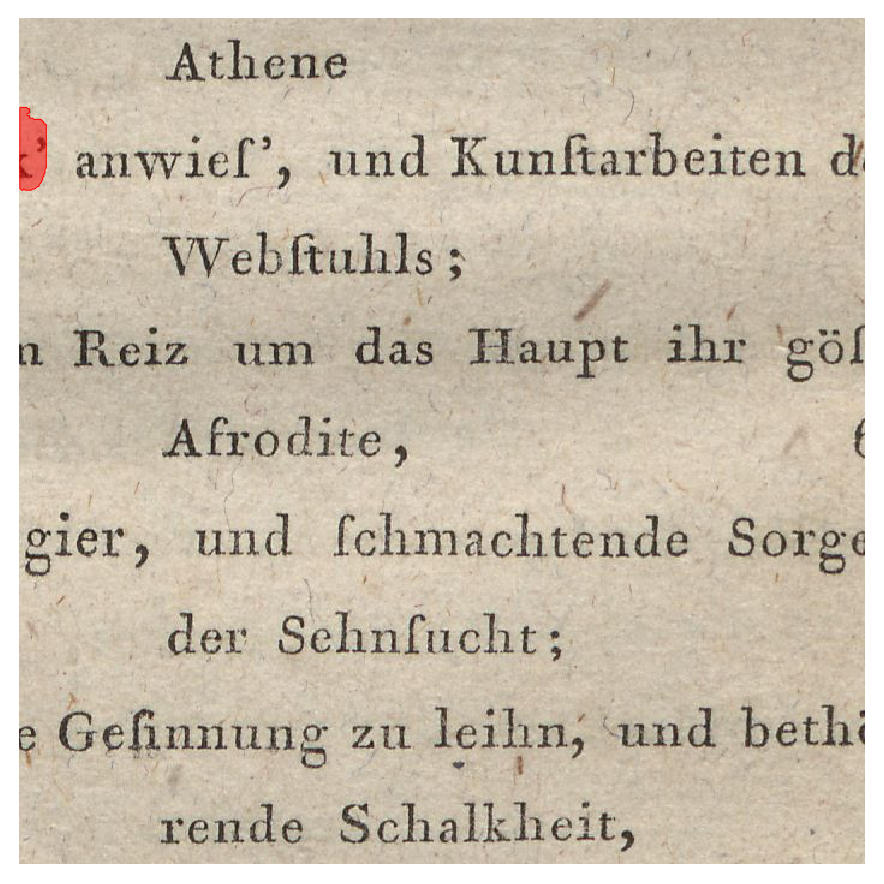


*** No instances to display *** 



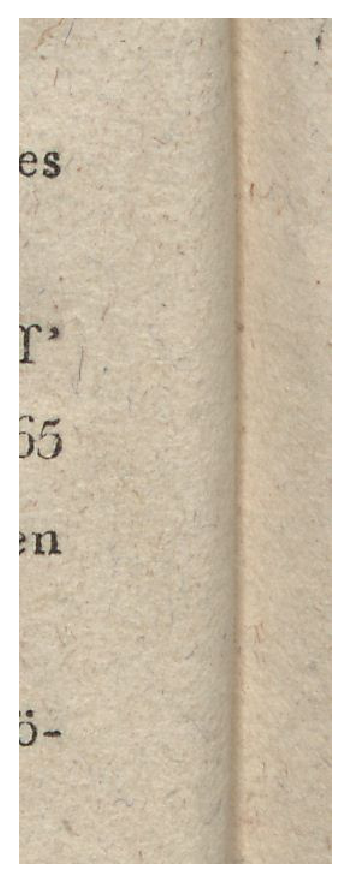


*** No instances to display *** 



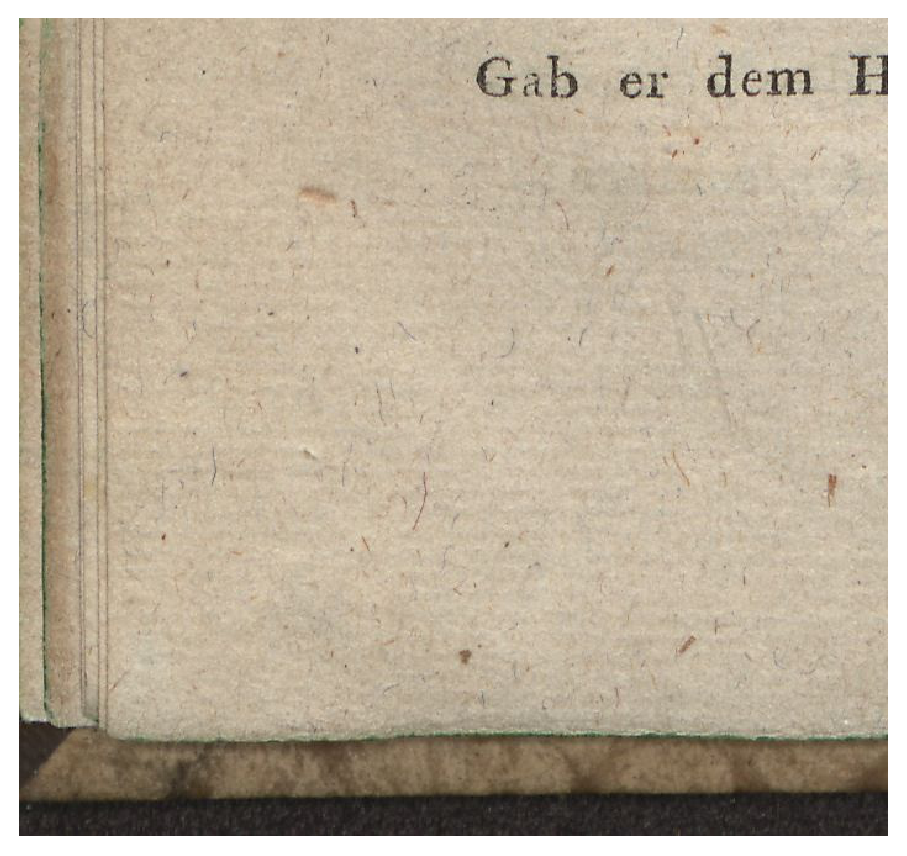


*** No instances to display *** 



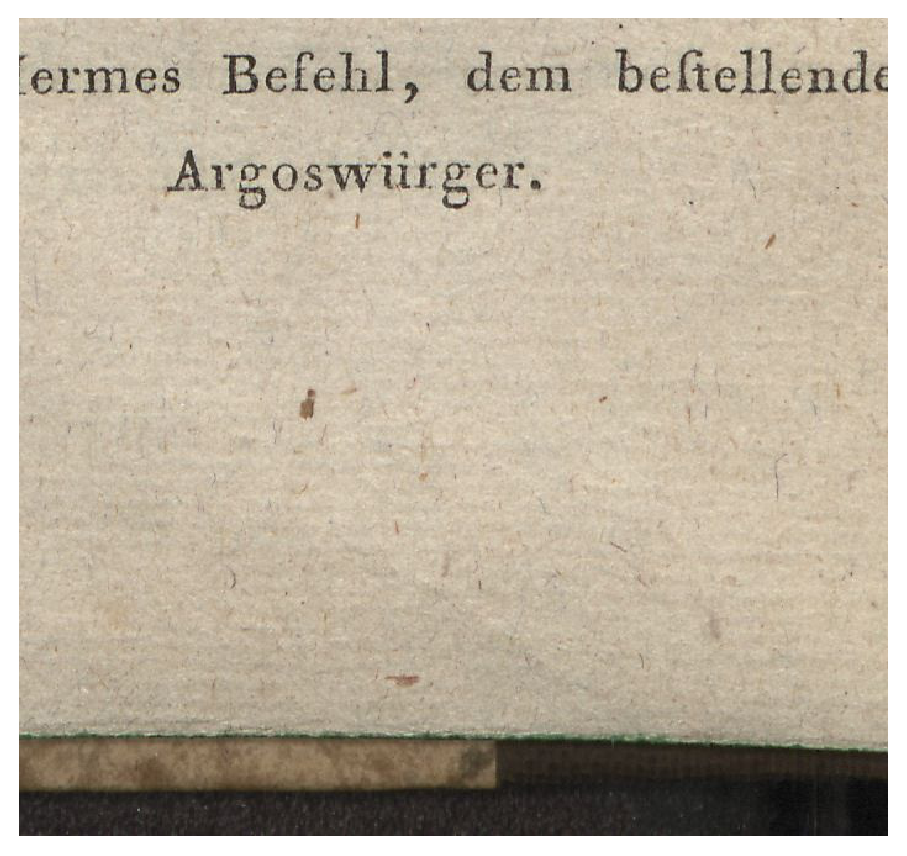


*** No instances to display *** 



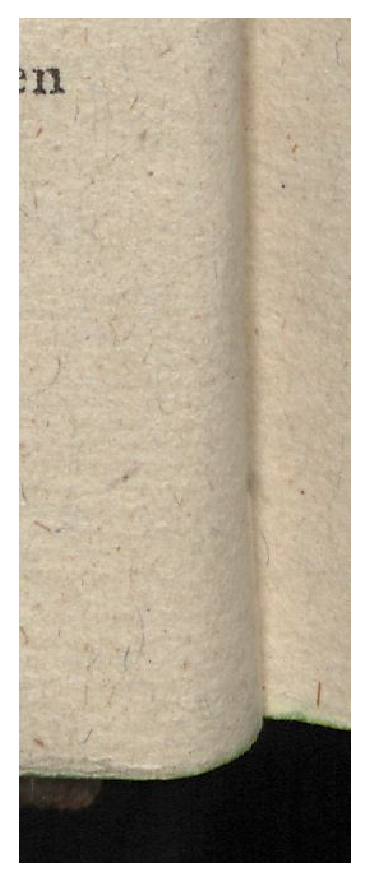

0.84803


In [22]:


from skimage import color
from skimage import io
from PIL import Image
import numpy as np
import scipy.misc
import subprocess
import tensorflow as tf
log_dir = "log-mg3/"
processes= []
mius = []



class InferenceConfig_1(ShapesConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    IMAGE_RESIZE_MODE = "crop"
    IMAGE_MIN_DIM = 704
    IMAGE_MAX_DIM = 704
    

# Model Trained on this above configuration.

model_path_1 = os.path.join(MODEL_DIR, "random_crop_mode_stage_2_1.h5")

    
inference_config_1 = InferenceConfig_1()

# # Recreate the model in inference mode
model_1 = modellib.MaskRCNN(mode="inference", 
                          config=inference_config_1,
                          model_dir=MODEL_DIR)


model_1.load_weights(model.find_last(), by_name=True)

# Load trained weights
print("Loading weights from ", model_path_1)




def evaluate_model(model):
    processes= []
    image_ids =  dataset_test.image_ids
   
    for image_id in image_ids:
        image_name = dataset_test.image_info[image_id]['id']+'.jpg'
        image = os.path.abspath("../../")
        image = os.path.join(image,'datasets', 'documents','images', 'test', image_name)        
        image = np.asarray(Image.open(image))        
        gt_path = os.path.abspath("../../")
        gt_path = os.path.join(gt_path,'datasets', 'documents', 'ground_truth', 'test')
        splitArray = image_name.split('.')
        image_name =  splitArray[0]+ '.png'
        gt_path = os.path.join(gt_path, image_name)
        gt = Image.open(gt_path)                
        gt = np.array(gt).astype('uint8')            
        image.shape = (image.shape[0], image.shape[1], image.shape[2])        
        prediction = np.ones((image.shape[0], image.shape[1], 3), dtype=np.uint8)                
        offsets_vertical = list(range(0, image.shape[0], 704))
        offsets_horizontal = list(range(0, image.shape[1], 704))
        for v in offsets_vertical:
            for h in offsets_horizontal:
                data = image[v:v+704, h:h+704,:]                
                results = model_1.detect([data], verbose=0)
                r = results[0]   
                visualize.display_instances(data, r['rois'], r['masks'], r['class_ids'], 
                dataset_test.class_names, r['scores']) 
                height, width, channel = data.shape                
                small_image = np.zeros((height,width,3), dtype=int)
                    
                for roi in r['rois']:       
                    y1, x1, y2, x2 = roi
                    small_image[y1:y2, x1:x2 ] = 1        
                prediction[v:v+704, h:h+704] += small_image.astype(np.uint8)
                
        im = Image.fromarray(prediction)
        prediction_path = os.path.join(log_dir, "prediction-private")
        if not os.path.isdir(prediction_path):
            os.makedirs(prediction_path)
        prediction_filename = os.path.join(prediction_path, os.path.basename(gt_path))
        im.save(prediction_filename)
        
        jar_dir = os.path.abspath("../../")
        jar_file = os.path.join(jar_dir,'LayoutAnalysisEvaluator.jar')    
        processes.append(subprocess.Popen(["java", "-jar", jar_file, "-p", prediction_filename, "-gt", gt_path], stdout=subprocess.PIPE))

    
    for p in processes:    
        miu = p.communicate()        
        miu = float(miu[0].splitlines()[0].split()[-1])    
        mius.append(miu)    
    return mius
                
                
mius = evaluate_model(model)
# print(mius)
print(np.mean(mius))


# Visualizing Anchors

In [11]:
from PIL import Image

backbone_shapes = modellib.compute_backbone_shapes(config, config.IMAGE_SHAPE)
anchors = utils.generate_pyramid_anchors(config.RPN_ANCHOR_SCALES,
                                             config.RPN_ANCHOR_RATIOS,
                                             backbone_shapes,
                                             config.BACKBONE_STRIDES,
                                             config.RPN_ANCHOR_STRIDE)


dataset_train = DocumentDataset()
dataset_train.whichDataSetToLoad = 'training'




path = os.path.join(os.getcwd(), '../../')

dataset_train.load_Document(os.path.join(path, 'datasets/documents/images/'), "train")
dataset_train.prepare()

image_ids = np.copy(dataset_train.image_ids)
#print(image_ids)

image, image_meta, gt_class_ids, gt_boxes, gt_masks = \
                modellib.load_image_gt(dataset_train, config, 1, augment=None,
                              augmentation=None,
                              use_mini_mask=config.USE_MINI_MASK)

rpn_match, rpn_bbox = modellib.build_rpn_targets(image.shape, anchors,
                                                    gt_class_ids, gt_boxes, config)

backbone_shapes = modellib.compute_backbone_shapes(config, config.IMAGE_SHAPE)



anchors = utils.generate_pyramid_anchors(config.RPN_ANCHOR_SCALES,
                                             config.RPN_ANCHOR_RATIOS,
                                             backbone_shapes,
                                             config.BACKBONE_STRIDES,
                                             config.RPN_ANCHOR_STRIDE)


anchors = utils.generate_pyramid_anchors(config.RPN_ANCHOR_SCALES, 
                                          config.RPN_ANCHOR_RATIOS,
                                          backbone_shapes,
                                          config.BACKBONE_STRIDES, 
                                          config.RPN_ANCHOR_STRIDE)

# Print summary of anchors
num_levels = len(backbone_shapes)
anchors_per_cell = len(config.RPN_ANCHOR_RATIOS)
print("Count: ", anchors.shape[0])
print("Scales: ", config.RPN_ANCHOR_SCALES)
print("ratios: ", config.RPN_ANCHOR_RATIOS)
print("Anchors per Cell: ", anchors_per_cell)
print("Levels: ", num_levels)
anchors_per_level = []
for l in range(num_levels):
    num_cells = backbone_shapes[l][0] * backbone_shapes[l][1]
    anchors_per_level.append(anchors_per_cell * num_cells // config.RPN_ANCHOR_STRIDE**2)
    print("Anchors in Level {}: {}".format(l, anchors_per_level[l]))



Count:  262080
Scales:  (32, 64, 128, 256, 512, 768)
ratios:  [0.5, 1, 2]
Anchors per Cell:  3
Levels:  6
Anchors in Level 0: 196608
Anchors in Level 1: 49152
Anchors in Level 2: 12288
Anchors in Level 3: 3072
Anchors in Level 4: 768
Anchors in Level 5: 192


image_id:  0.0 /home/harsh/Mask_RCNN/datasets/documents/images/test/582a_Hesiods_Werke_0006_00000006.jpg
BG                     : 177
balloon                : 23
image_id:  4.0 /home/harsh/Mask_RCNN/datasets/documents/images/test/0003_grimm_donner_1855_0003.jpg
BG                     : 174
balloon                : 26
image_id:  8.0 /home/harsh/Mask_RCNN/datasets/documents/images/test/0004_1433243313511_1_227_Seite_1_Bild_0002.jpg
BG                     : 154
balloon                : 46


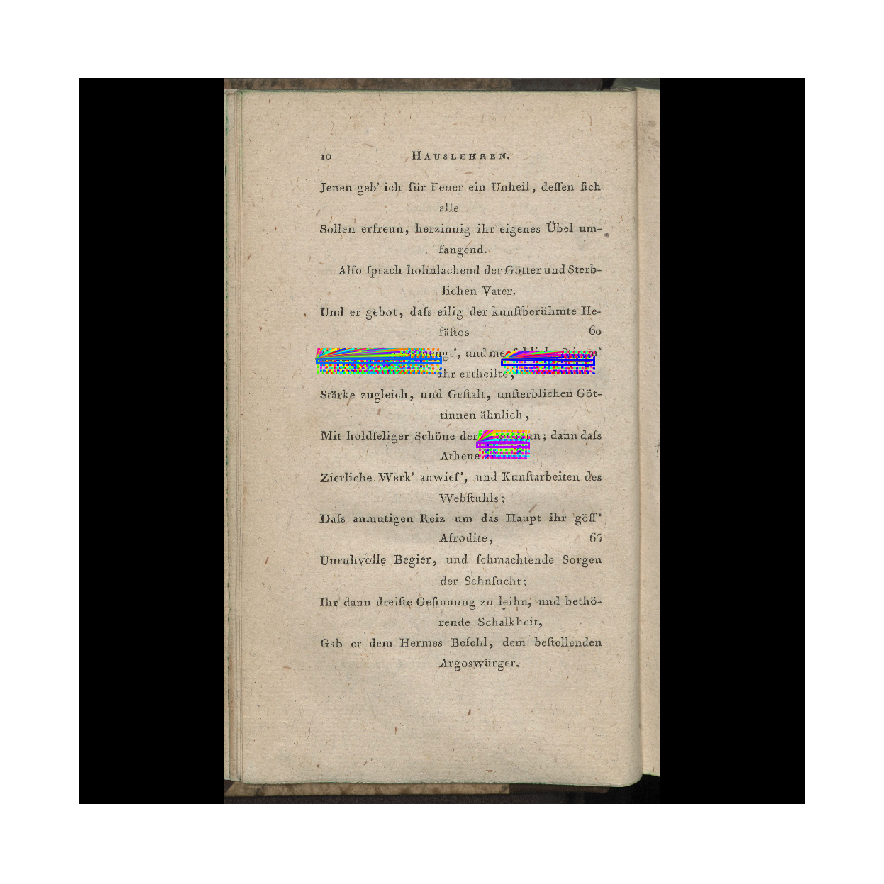

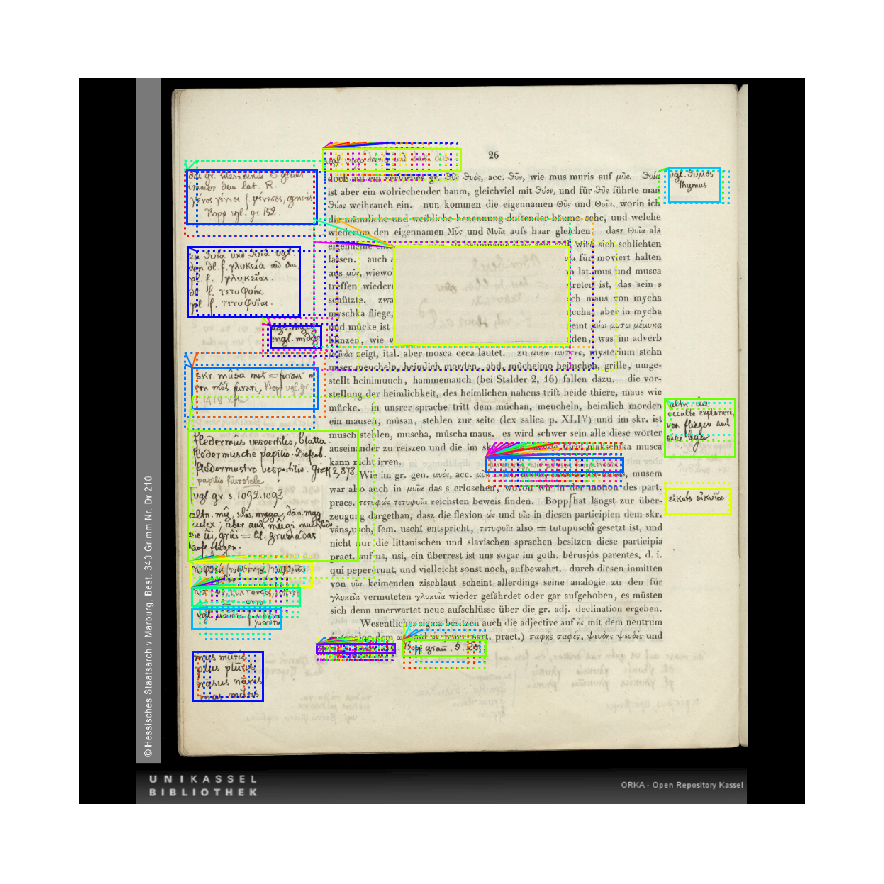

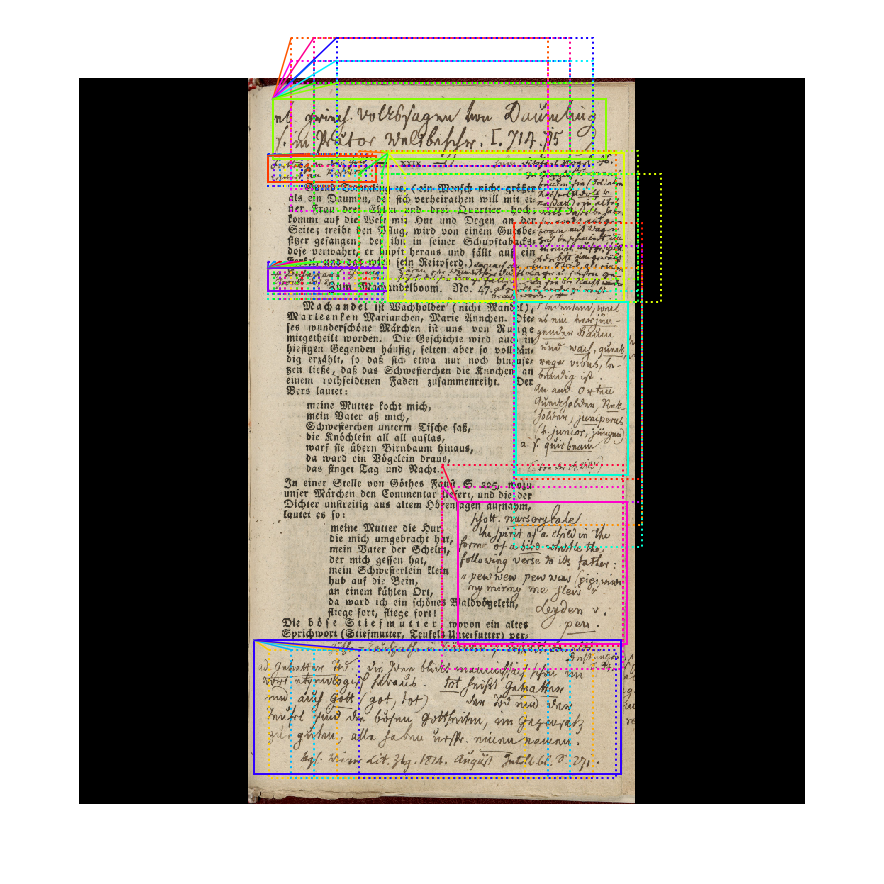

In [35]:
random_rois = 2000
g = modellib.data_generator(
    dataset_test, config, shuffle=False, random_rois=random_rois, 
    batch_size=4,
    detection_targets=True)


for j in range(9):
    # Get Next Image    
    if random_rois:        
        [normalized_images, image_meta, rpn_match, rpn_bbox, gt_class_ids, gt_boxes, gt_masks, rpn_rois, rois], \
        [mrcnn_class_ids, mrcnn_bbox, mrcnn_mask] = next(g)

#         log("rois", rois)
#         log("mrcnn_class_ids", mrcnn_class_ids)
#         log("mrcnn_bbox", mrcnn_bbox)
#         log("mrcnn_mask", mrcnn_mask)
    else:
        [normalized_images, image_meta, rpn_match, rpn_bbox, gt_boxes, gt_masks], _ = next(g)

#     log("gt_class_ids", gt_class_ids)
#     log("gt_boxes", gt_boxes)
#     log("gt_masks", gt_masks)
#     log("rpn_match", rpn_match, )
#     log("rpn_bbox", rpn_bbox)
    image_id = image_meta[0][0]

    print("image_id: ", image_id, dataset_test.image_reference(int(image_id)))

    # Remove the last dim in mrcnn_class_ids. It's only added
    # to satisfy Keras restriction on target shape.
    mrcnn_class_ids = mrcnn_class_ids[:,:,0]



    b = 0

    # Restore original image (reverse normalization)
    sample_image = modellib.unmold_image(normalized_images[b], config)

    # Compute anchor shifts.
    indices = np.where(rpn_match[b] == 1)[0]
    refined_anchors = utils.apply_box_deltas(anchors[indices], rpn_bbox[b, :len(indices)] * config.RPN_BBOX_STD_DEV)
  #  log("anchors", anchors)
  #  log("refined_anchors", refined_anchors)

    # Get list of positive anchors
    positive_anchor_ids = np.where(rpn_match[b] == 1)[0]
 #   print("Positive anchors: {}".format(len(positive_anchor_ids)))
    negative_anchor_ids = np.where(rpn_match[b] == -1)[0]
  #  print("Negative anchors: {}".format(len(negative_anchor_ids)))
    neutral_anchor_ids = np.where(rpn_match[b] == 0)[0]
   # print("Neutral anchors: {}".format(len(neutral_anchor_ids)))

    # ROI breakdown by class
    for c, n in zip(dataset_test.class_names, np.bincount(mrcnn_class_ids[b].flatten())):
        if n:
            print("{:23}: {}".format(c[:20], n))

    # Show positive anchors
    fig, ax = plt.subplots(1, figsize=(16, 16))
    visualize.draw_boxes(sample_image, boxes=anchors[positive_anchor_ids], 
                         refined_boxes=refined_anchors, ax=ax)

  #  visualize.draw_boxes(sample_image, boxes=anchors[negative_anchor_ids])

    #visualize.draw_boxes(sample_image, boxes=anchors[np.random.choice(neutral_anchor_ids, 100)])



# Ensembling

### I) Ensembled Train Data Generation

In [12]:
models = [model]
# write all the prediction including original image as np array to pickle file

import h5py
import os

 
save_dir = os.path.join(os.getcwd(), "output_train")
if not os.path.exists(save_dir):
        os.makedirs(save_dir)
        
for the_file in os.listdir(save_dir):    
    try:
            if os.path.isfile(the_file):
                print('unlink')
                os.unlink(the_file)            
    except Exception as e:
        print(e)
        
print("Files Removed!")


image_ids =  dataset_train.image_ids


for image_id in image_ids:          
        saved_f5_file_name = "output_train/"+ dataset_train.image_info[image_id]['id']+".pickle"

        predictions = []
        predictionss = []
        image_name = dataset_train.image_info[image_id]['id']+'.jpg'        
        train_image = os.path.abspath("../../")
        train_image = os.path.join(train_image,'datasets', 'documents','images', 'train', image_name)        
        img = train_image
        img = Image.open(img)
        img = np.array(img).astype('uint8')            
        image, image_meta, gt_class_id, gt_bbox, gt_mask =\
            modellib.load_image_gt(dataset_train, inference_config, 
                               image_id, use_mini_mask=False)        
        pixels = np.array(img)           
        pixels = pixels.astype('float32')
        
        # normalize to the range 0-1
        pixels /= 255.0          
        predictions.append(pixels)                     
       
        for model in models:
            results = model.detect([img], verbose=0)
            r = results[0]                        
            prediction = np.array(r['masks'])            
            # do logical or over prediction coming from above
            prediction = np.sum(prediction, axis = 2)    
            prediction = np.expand_dims(prediction, axis=2)                        
            predictions.append(prediction) 
        predictionss = np.concatenate(predictions, axis=2)
        print(predictionss.shape)          
        image_id = str(image_id)   
        with open(saved_f5_file_name, "wb") as f_out:
            pickle.dump(predictionss, f_out)

Files Removed!
(2775, 1668, 4)
(4945, 3477, 4)
(3228, 2054, 4)
(3920, 3193, 4)
(1187, 1000, 4)
(1650, 1000, 4)
(4250, 2508, 4)
(4251, 2509, 4)
(4652, 2475, 4)
(3669, 2495, 4)


### II) Ensembled Test Data Generation

In [ ]:
models = [model]
# write all the prediction including original image as np array to h5py file

import h5py
import os

 
save_dir = os.path.join(os.getcwd(), "output_test")
if not os.path.exists(save_dir):
        os.makedirs(save_dir)
        
for the_file in os.listdir(save_dir):    
    try:
            if os.path.isfile(the_file):
                print('unlink')
                os.unlink(the_file)            
    except Exception as e:
        print(e)
        
print("Files Removed!")


image_ids =  dataset_test.image_ids


for image_id in image_ids:          
        saved_f5_file_name = "output_test/"+ dataset_test.image_info[image_id]['id']+".pickle"

        predictions = []
        predictionss = []
        image_name = dataset_test.image_info[image_id]['id']+'.jpg'        
        test_image = os.path.abspath("../../")
        test_image = os.path.join(test_image,'datasets', 'documents','images', 'test', image_name)        
        img = test_image
        img = Image.open(img)
        img = np.array(img).astype('uint8')            
        image, image_meta, gt_class_id, gt_bbox, gt_mask =\
            modellib.load_image_gt(dataset_test, inference_config, 
                               image_id, use_mini_mask=False)        
        pixels = np.array(img)           
        pixels = pixels.astype('float32')
        
        # normalize to the range 0-1
        pixels /= 255.0          
        predictions.append(pixels)                     
       
        for model in models:
            results = model.detect([img], verbose=0)
            r = results[0]                        
            prediction = np.array(r['masks'])            
            # do logical or over prediction coming from above
            prediction = np.sum(prediction, axis = 2)    
            prediction = np.expand_dims(prediction, axis=2)                        
            predictions.append(prediction) 
        predictionss = np.concatenate(predictions, axis=2)
        print(predictionss.shape)          
        image_id = str(image_id)   
        with open(saved_f5_file_name, "wb") as f_out:
            pickle.dump(predictionss, f_out)